# Image search using image embeddings

In [240]:
# import
import os
import pandas as pd
import random
from PIL import Image
from matplotlib import pyplot as plt
import cv2
from dotenv import load_dotenv
import requests
import math
from img2vec_pytorch import Img2Vec

In [241]:
# Configurations
target_folder = "val2017"
source_folder = "test2017"
top_n = 20

In [242]:
# Load Azure Computer Vision embeddings
azurecv_embeddings = pd.read_parquet("azurecv_image_embeddings.parquet")

# Load EfficientNet b3 embeddings
efficientnet_b3_embeddings = pd.read_parquet("efficientnet_b3_image_embeddings.parquet")

# Load ResNet18 embeddings
resnet18_embeddings = pd.read_parquet("resnet18_image_embeddings.parquet")

In [243]:
# Function to calculate cosine similarity
def get_cosine_similarity(vector1, vector2):
    dot_product = sum(a*b for a, b in zip(vector1, vector2))
    magnitude1 = math.sqrt(sum((val*val) for val in vector1))
    magnitude2 = math.sqrt(sum((val*val) for val in vector2))
    return dot_product / (magnitude1 * magnitude2)

test2017/000000579033.jpg


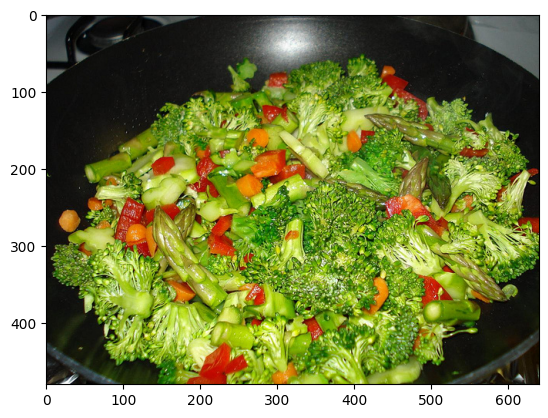

In [244]:
# Get source image
files = os.listdir(source_folder)
source_file = f"{source_folder}/{random.choice(files)}"
print(source_file)
source_image = cv2.imread(source_file)
plt.imshow(cv2.cvtColor(source_image, cv2.COLOR_BGR2RGB))

## Azure Computer Vision image embeddings

In [245]:
# Load envs
load_dotenv('.env')

# Azure Computer Vision
key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

# Get embeddings function
def get_embedding(imagefile):
    """
    Get embedding from an image using Azure Computer Vision 4
    """
    # settings
    model = "?api-version=2023-02-01-preview&modelVersion=latest"
    url = endpoint + "/computervision/retrieval:vectorizeImage" + model
    headers = {
        "Content-type": "application/octet-stream",
        "Ocp-Apim-Subscription-Key": key,
    }

    # Read the image file
    with open(imagefile, "rb") as f:
        data = f.read()

    # Sending the requests
    r = requests.post(url, data=data, headers=headers)
    results = r.json()
    embeddings = results['vector']

    return embeddings

In [246]:
# Get source image embeddings
source_embedding = get_embedding(source_file)

# Calculate cosine similarity for each image
azurecv_embeddings['similarity'] = azurecv_embeddings['embedding'].apply(lambda x: get_cosine_similarity(source_embedding, x))

# Sort by similarity and select top n
top_results = azurecv_embeddings.loc[:, ['filename', 'similarity']].sort_values(by='similarity', ascending=False).head(top_n)

ORIGINAL IMAGE


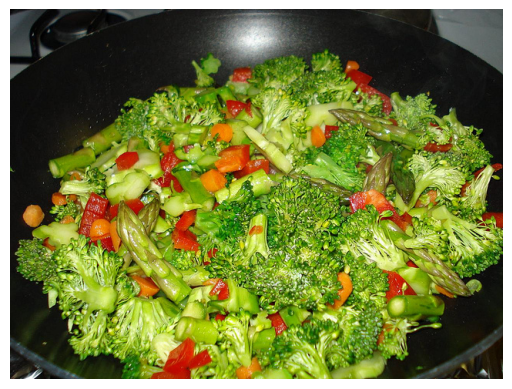

SIMILAR IMAGES


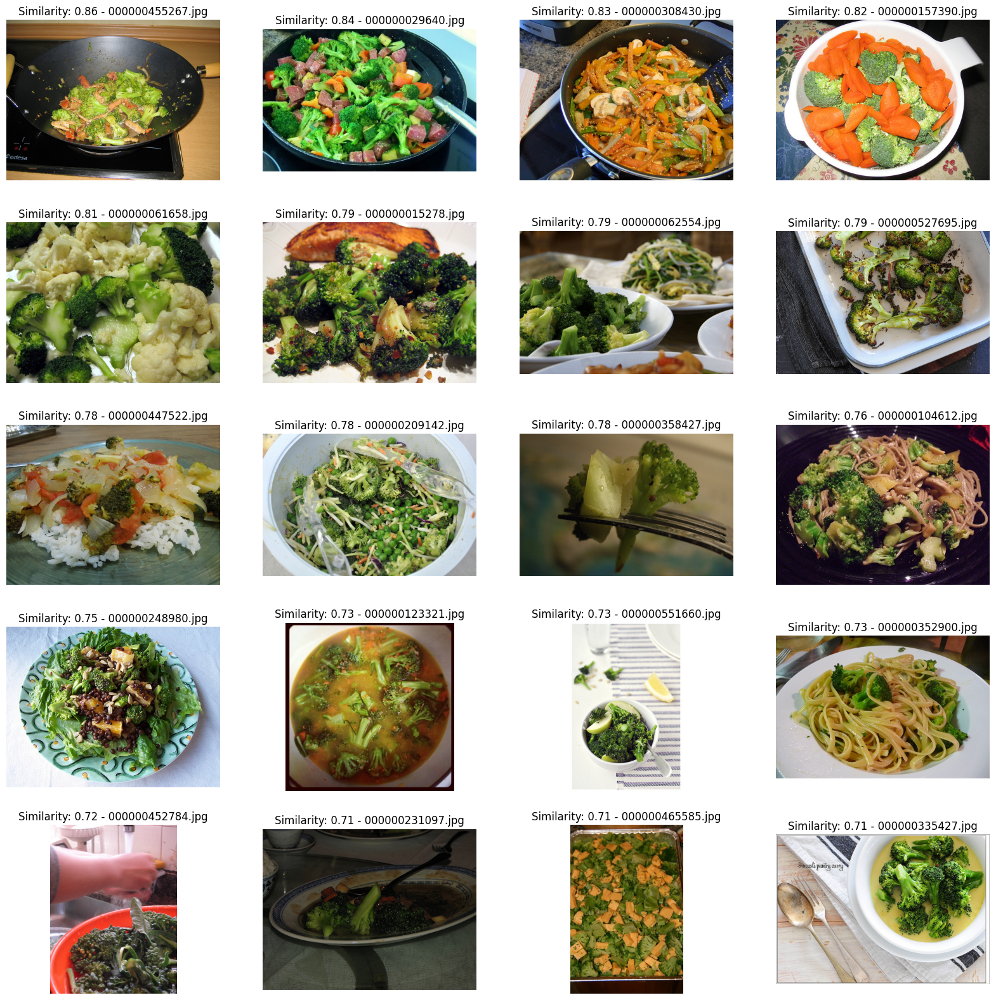

In [247]:
print("ORIGINAL IMAGE")
plt.imshow(cv2.cvtColor(source_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

print("SIMILAR IMAGES")
fig, axs = plt.subplots(5, 4, figsize=(20, 20))

# Iterate over the rows of the DataFrame
i = 0
for index, row in top_results.iterrows():
    # Load the image
    image = Image.open(f"{target_folder}/{row['filename']}")
    
    # Calculate the row and column indices
    row_index = i // 4
    col_index = i % 4
    i += 1
    
    # Display the image in the appropriate subplot
    axs[row_index, col_index].imshow(image)
    axs[row_index, col_index].axis('off')
    axs[row_index, col_index].set_title(f"Similarity: {row['similarity']:.2f} - {row['filename']}")
    
# Show the subplots
plt.show()

## EfficientNet B3 embeddings

In [ ]:
# Get client
img2vec = Img2Vec(model='efficientnet_b3')

# Get source image
img = Image.open(source_file)

# Get source image embeddings
source_embedding = img2vec.get_vec(img, tensor=False)

# Calculate cosine similarity for each image
efficientnet_b3_embeddings['similarity'] = efficientnet_b3_embeddings['embedding'].apply(lambda x: get_cosine_similarity(source_embedding, x))

# Sort by similarity and select top n
top_results = efficientnet_b3_embeddings.loc[:, ['filename', 'similarity']].sort_values(by='similarity', ascending=False).head(top_n)

ORIGINAL IMAGE


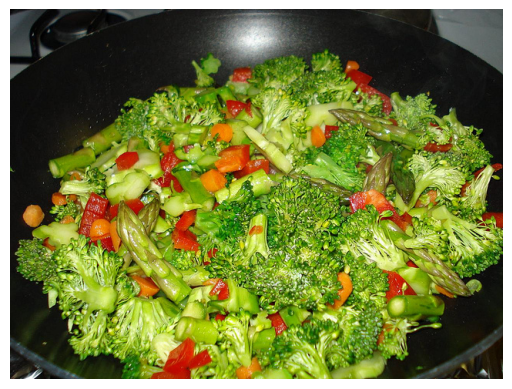

SIMILAR IMAGES


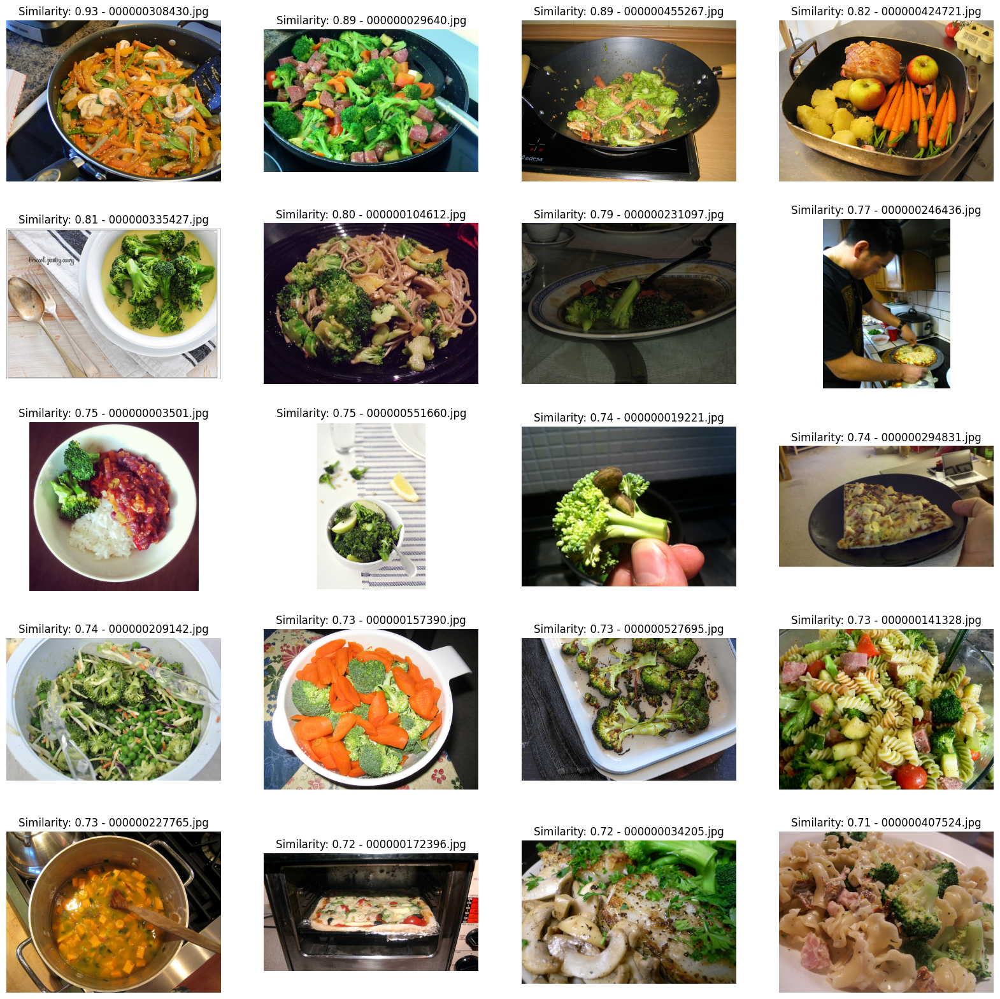

In [249]:
print("ORIGINAL IMAGE")
plt.imshow(cv2.cvtColor(source_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

print("SIMILAR IMAGES")
fig, axs = plt.subplots(5, 4, figsize=(20, 20))

# Iterate over the rows of the DataFrame
i = 0
for index, row in top_results.iterrows():
    # Load the image
    image = Image.open(f"{target_folder}/{row['filename']}")
    
    # Calculate the row and column indices
    row_index = i // 4
    col_index = i % 4
    i += 1
    
    # Display the image in the appropriate subplot
    axs[row_index, col_index].imshow(image)
    axs[row_index, col_index].axis('off')
    axs[row_index, col_index].set_title(f"Similarity: {row['similarity']:.2f} - {row['filename']}")
    
# Show the subplots
plt.show()

## ResNet18 embeddings

In [ ]:
# Get client
img2vec = Img2Vec(model='resnet18')

# Get source image
img = Image.open(source_file)

# Get source image embeddings
source_embedding = img2vec.get_vec(img, tensor=False)

# Calculate cosine similarity for each image
resnet18_embeddings['similarity'] = resnet18_embeddings['embedding'].apply(lambda x: get_cosine_similarity(source_embedding, x))

# Sort by similarity and select top n
top_results = resnet18_embeddings.loc[:, ['filename', 'similarity']].sort_values(by='similarity', ascending=False).head(top_n)

ORIGINAL IMAGE


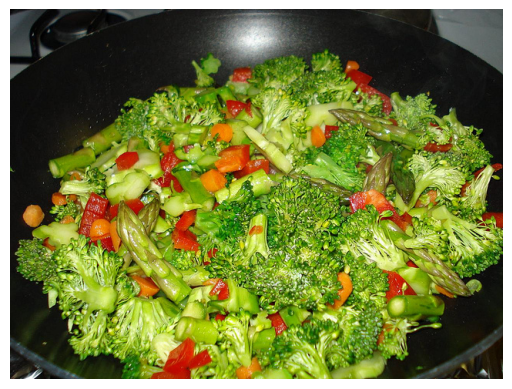

SIMILAR IMAGES


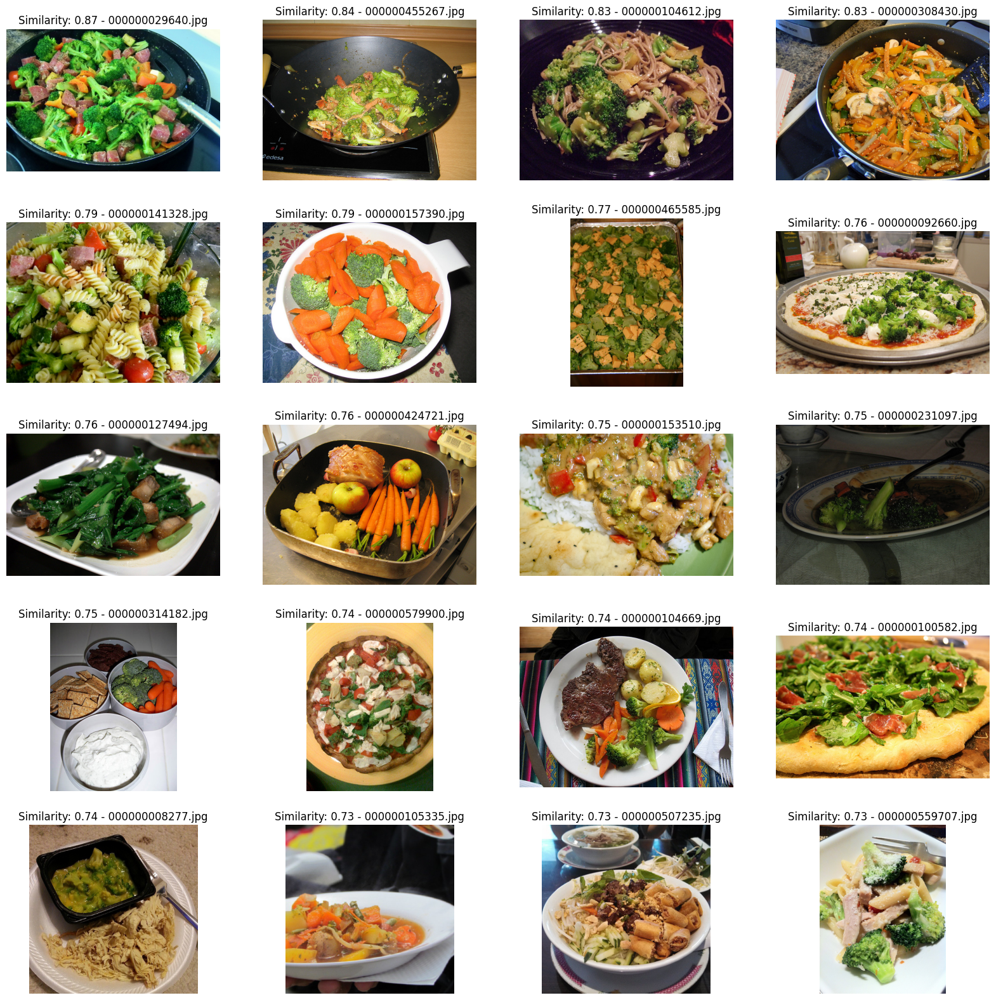

In [251]:
print("ORIGINAL IMAGE")
plt.imshow(cv2.cvtColor(source_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

print("SIMILAR IMAGES")
fig, axs = plt.subplots(5, 4, figsize=(20, 20))

# Iterate over the rows of the DataFrame
i = 0
for index, row in top_results.iterrows():
    # Load the image
    image = Image.open(f"{target_folder}/{row['filename']}")
    
    # Calculate the row and column indices
    row_index = i // 4
    col_index = i % 4
    i += 1
    
    # Display the image in the appropriate subplot
    axs[row_index, col_index].imshow(image)
    axs[row_index, col_index].axis('off')
    axs[row_index, col_index].set_title(f"Similarity: {row['similarity']:.2f} - {row['filename']}")
    
# Show the subplots
plt.show()